# Milestone Project 1: Food Vision Big

See the annotated version of this notebook on GitHub: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/07_food_vision_milestone_project_1.ipynb

## Check GPU:

Google Colab offers free GPUs (thank you Google), however, not all of them are compatible with mixed precision training.

Google Colab offers:
* K80 (not compatible)
* P100 (not compatible)
* Tesla T4 (compatible)

Knowing this, in order to use mixed precision training, we need access to a Tesla T4 (from within Google Colab), or if we're using our own hardware, our GPU needs a score of 7.0+ (see here: https://developer.nvidia.com/cuda-gpus).

In [1]:
!nvidia-smi -L

GPU 0: NVIDIA GeForce GTX 1650 (UUID: GPU-8feeade6-0be8-8d5a-0dab-1e1fd2efb5f5)


## Get Helper Functions:

In past modules, we've created a bunch of helper functions to do small tasks required for our notebooks.

Rather than rewrite all of these, we can import a script and load them in from there.

The script we've got available can be found on GitHub: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/helper_functions.py

In [2]:
# Download helper functions script
!wget https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/helper_functions.py

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
# Import series of helper functions for the notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_historys

## Use TensorFlow Datasets To Download Data:

If you want to get an overview of TensorFlow Datasets (TFDS), read the guide: https://www.tensorflow.org/datasets/overview

In [2]:
# Get TensorFlow Datasets
import tensorflow_datasets as tfds

In [7]:
# List all available datasets
datasets_list = tfds.list_builders() # Get all available datasets in TFDS
print('food101' in datasets_list) # Is our target dataset in the list of TFDS datasets?

True


🛠️ **Exercise:** Running the following cell can take a while using Google Colab (about 5-6 minutes). While your data is downloading, have a read through the TensorFlow Datasets documentation: https://www.tensorflow.org/datasets/overview

🔑 **Note:** Some of the datasets contained within TensorFlow datasets are over 100GB+, meaning if you run the cell below (outside of Google Colab), you might be downloading 100GB+ to your coumputer or the computer that you're using. Beware as this could take a large amount of bandwidth.

In [26]:
# Load in the data (takes 5-6 minutes in Google Colab)
(train_data, test_data), ds_info = tfds.load(name = 'food101',
                                             split = ['train', 'validation'],
                                             shuffle_files = False,
                                             as_supervised = True, # Data gets returned in tuple format (data, label)
                                             with_info = True) # Adds metadata to the download

## Exploring The Food101 Data From TensorFlow Datasets:

To become one with our data, we want to find:
* Class names
* The shape of our input data (image tensors)
* The datatype of our input data
* What the labels look like (e.g. are they one-hot encoded or are they label encoded)
* Do the labels match up with the class names?

In [9]:
# Features of Food101 from TFDS
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [10]:
# Get the class names
class_names = ds_info.features['label'].names
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [11]:
# Take one sample of the train data
train_one_sample = train_data.take(1) # Samples are in format (image_tensor, label)

In [12]:
# What does one sample of our training data look like?
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [13]:
# Output info about our training sample
for image, label in train_one_sample:
    print(f"""
    Image Shape: {image.shape}
    Image Datatype: {image.dtype}
    Target Class From Food101 (tensor form): {label}
    Class Name (str form): {class_names[label.numpy()]}
    """)


    Image Shape: (512, 512, 3)
    Image Datatype: <dtype: 'uint8'>
    Target Class From Food101 (tensor form): 81
    Class Name (str form): ramen
    


In [14]:
# What does our image tensor from TFDS's Food101 look like?
image

<tf.Tensor: shape=(512, 512, 3), dtype=uint8, numpy=
array([[[242, 254, 252],
        [241, 253, 251],
        [240, 252, 250],
        ...,
        [241, 211, 101],
        [242, 212, 102],
        [245, 215, 105]],

       [[240, 252, 250],
        [240, 252, 250],
        [239, 251, 249],
        ...,
        [245, 215, 105],
        [242, 212, 102],
        [240, 210, 100]],

       [[238, 250, 248],
        [238, 250, 248],
        [238, 250, 248],
        ...,
        [250, 218, 107],
        [243, 211, 100],
        [238, 206,  95]],

       ...,

       [[ 82,  81,  77],
        [ 83,  82,  78],
        [ 82,  81,  77],
        ...,
        [126, 128, 127],
        [135, 137, 136],
        [139, 141, 140]],

       [[ 82,  79,  74],
        [ 82,  79,  74],
        [ 81,  78,  73],
        ...,
        [209, 209, 209],
        [217, 217, 217],
        [215, 215, 215]],

       [[ 78,  75,  70],
        [ 77,  74,  69],
        [ 76,  73,  68],
        ...,
        [187, 187, 18

In [15]:
# What are the min and max values of our image tensor?
import tensorflow as tf
tf.reduce_min(image), tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

### Plot An Image From TensorFlow Datasets:

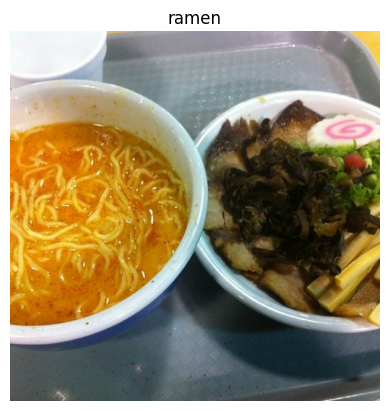

In [16]:
# Plot an image tensor
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()]) # Add title to image to verify the label is associated with the right image
plt.axis(False);

## Create Preprocessing Functions For Our Data:

Neural networks perform best when data is in a certain way (e.g. batched, normalized, etc).

However, not all data (including data from TensorFlow Datasets) comes like this.

So in order to get it ready for a neural network, you'll often have to write preprocessing functions and map it to your data.

What we know about our data:
* In `uint8` datatype
* Comprised of all different size tensors (different sized images)
* Not scaled (the pixel values are between 0 & 255)

What we know models like:
* Data in `float32` dtype  (or for mixed precision `float16` and `float32`)
* For batches, TensorFlow likes all of the tensors within a batch to be of the same size
* Scaled (values between 0 & 1), also called normalized tensors, generally perform better

With these points in mind, we've got a few things we can tackle with a preprocessing function.

Since we're going to be using an EfficientNetBX pretrained model from tf.keras.applications, we don't need to rescale our data (these architectures have rescaling built-in).

This means our function needs to:
1. Reshape our images to all the same size
2. Convert the dtype of our image tensors from `uint8` to `float32`

In [11]:
# Make a function for preprocessing images
def preprocess_img(image, label, img_shape = 224):
    """
    Converts image datatype from `uint8` -> `float32` and reshapes image to [img_shape, img_shape, color_channels]
    """
    image = tf.image.resize(image, [img_shape, img_shape]) # Reshape target image
    # image = image / 255. # Scale image values (not required with EfficientNetBX models from tf.keras.applications)
    return tf.cast(image, tf.float32), label # Return (float32_image, label) tuple

In [44]:
# Preprocess a single sample image and check the outputs
preprocessed_img = preprocess_img(image, label)[0]

#Quick fix:
preprocessed_img = tf.expand_dims(preprocessed_img, axis = 0)

print(f'Image before preprocessing:\n {image[:2]}...,\nShape: {image.shape},\nDatatype: {image.dtype}\n')
print(f'Image after preprocessing:\n{preprocessed_img[:2]}...,\nShape: {preprocessed_img.shape},\nDatatype: {preprocessed_img.dtype}')

Image before preprocessing:
 [[[242 254 252]
  [241 253 251]
  [240 252 250]
  ...
  [241 211 101]
  [242 212 102]
  [245 215 105]]

 [[240 252 250]
  [240 252 250]
  [239 251 249]
  ...
  [245 215 105]
  [242 212 102]
  [240 210 100]]]...,
Shape: (512, 512, 3),
Datatype: <dtype: 'uint8'>

Image after preprocessing:
[[[[240.4847   252.4847   250.4847  ]
   [238.42857  250.42857  248.42857 ]
   [238.29082  249.86224  248.07652 ]
   ...
   [251.4235   219.20923  107.78071 ]
   [246.3571   216.3571   106.3571  ]
   [241.92346  211.92346  101.92346 ]]

  [[237.07143  249.07143  247.07143 ]
   [238.       250.       248.      ]
   [240.14285  250.14285  249.14285 ]
   ...
   [248.22957  215.28569  101.85716 ]
   [250.99489  218.99489  106.27042 ]
   [243.07126  211.07126  100.07126 ]]

  [[238.13776  249.70918  247.92346 ]
   [240.92857  250.92857  249.92857 ]
   [241.78572  251.78572  250.78572 ]
   ...
   [249.78574  214.35716   98.142876]
   [247.42857  214.        98.78571 ]
   [249.852

## Batch & Prepare Datasets:

We're now going to make our data input pipeline run really fast.

For more resources on this, I'd highly recommend going through the following guide: https://www.tensorflow.org/guide/data_performance

In [27]:
# Map preprocessing function to training dataset (and parallelize)
train_data = train_data.map(map_func = preprocess_img, num_parallel_calls = tf.data.AUTOTUNE)

# Shuffle train_data and turn it into batches and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size = 1000).batch(batch_size = 32).prefetch(buffer_size = tf.data.AUTOTUNE)
#The buffer_size parameter in the shuffle method denotes the number of samples to shuffle at a time; ideally, it should be the whole dataset, but should be limited due to memory limitations

# Map preprocessing function to test data
test_data = test_data.map(map_func = preprocess_img, num_parallel_calls = tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)

In [46]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

"Hey, TensorFlow, map this preprocessing function (`preprocess_img`) across our training dataset, then shuffle a number of elements and then batch them together and finally make sure you prepare new batches (prefetch) whilst the model is looking through (finding patterns) in the current batch."

## Create Modelling Callbacks:

We're going to create a couple of callbacks to help us while our model trains:
* TensorBoard callback to log training results (so we can visualize them later if need be)
* ModelCheckpoint callback to save our model's progress after feature extraction

In [24]:
# Create tensorboard callback (import from helper_functions.py)
from helper_functions import create_tensorboard_callback

# Create ModelCheckpoint callback to save a model's progress during training
checkpoint_path = 'model_checkpoints/cp.weights.h5'
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor = 'val_acc',
                                                      save_best_only = True,
                                                      save_weights_only = True,
                                                      verbose = 0) # Don't print whether or not model is being saved

## Set Up Mixed Precision Training:

First and foremost, for a deeper understanding of mixed precision training, check out the TensorFlow guide for mixed precision: https://www.tensorflow.org/guide/mixed_precision

Mixed precision utilizes a combination of float32 and float16 data types to speed up model performance.

In [ ]:
# Turn on mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16') # Set global data policy to mixed precision

In [27]:
mixed_precision.global_policy()

<DTypePolicy "mixed_float16">

## Build Feature Extraction Model:

In [ ]:
from tensorflow.keras import layers

# Create base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.EfficientNetV2B0(include_top = False)
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape = input_shape, name = 'input_layer')
# Note: EfficientNetV2BX models have rescaling built-in, but if your model doesn't, you can have a layer like below:
# x = layers.Rescaling(1./255)(x)
x = base_model(inputs, training = False) # Make sure layers which should be in inference mode only stay like that
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype = tf.float32, name = 'softmax_float32')(x) #New layer added for mixed precision training
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(),
              metrics = ['accuracy'])

In [48]:
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 101)            │       129,381 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cast_8 (Cast)                   │ (None, 101)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_float32 (Activation)    │ (None, 101)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,048,693 (23.07 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

## Checking Layer Dtype Policies (Are We Using Mixed Precision?):

In [49]:
# Check the dtype_policy attributes of layers in our model
for layer in model.layers:
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
efficientnetv2-b0 False float32 <DTypePolicy "mixed_float16">
global_average_pooling2d_3 True float32 <DTypePolicy "mixed_float16">
dense_3 True float32 <DTypePolicy "mixed_float16">
softmax_float32 True float32 <DTypePolicy "float32">


Going through the above, we see:
* `layer.name`: The human readable name of a particular layer
* `layer.trainable`: Is the layer trainable or not? (if `False`, the weights are frozen)
* `layer.dtype`: The datatype a layer stores its variables in
* `layer.dtype_policy`: The data type policy a layer computes on its variables with

In [50]:
# Check the dtype_policy attributes of layer in the base model
for layer in model.layers[1].layers: # Check the layers of the base model (layer at index 1 of `model`)
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer_4 False float32 <DTypePolicy "mixed_float16">
rescaling_4 False float32 <DTypePolicy "mixed_float16">
normalization_4 False float32 <DTypePolicy "mixed_float16">
stem_conv False float32 <DTypePolicy "mixed_float16">
stem_bn False float32 <DTypePolicy "mixed_float16">
stem_activation False float32 <DTypePolicy "mixed_float16">
block1a_project_conv False float32 <DTypePolicy "mixed_float16">
block1a_project_bn False float32 <DTypePolicy "mixed_float16">
block1a_project_activation False float32 <DTypePolicy "mixed_float16">
block2a_expand_conv False float32 <DTypePolicy "mixed_float16">
block2a_expand_bn False float32 <DTypePolicy "mixed_float16">
block2a_expand_activation False float32 <DTypePolicy "mixed_float16">
block2a_project_conv False float32 <DTypePolicy "mixed_float16">
block2a_project_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_conv False float32 <DTypePolicy "mixed_float16">
block2b_expand_bn False float32 <DTypePolicy "mixed_float16">
block2b_exp

In [51]:
for layer in model.layers[1].layers[:20]:
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer_4 False float32 <DTypePolicy "mixed_float16">
rescaling_4 False float32 <DTypePolicy "mixed_float16">
normalization_4 False float32 <DTypePolicy "mixed_float16">
stem_conv False float32 <DTypePolicy "mixed_float16">
stem_bn False float32 <DTypePolicy "mixed_float16">
stem_activation False float32 <DTypePolicy "mixed_float16">
block1a_project_conv False float32 <DTypePolicy "mixed_float16">
block1a_project_bn False float32 <DTypePolicy "mixed_float16">
block1a_project_activation False float32 <DTypePolicy "mixed_float16">
block2a_expand_conv False float32 <DTypePolicy "mixed_float16">
block2a_expand_bn False float32 <DTypePolicy "mixed_float16">
block2a_expand_activation False float32 <DTypePolicy "mixed_float16">
block2a_project_conv False float32 <DTypePolicy "mixed_float16">
block2a_project_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_conv False float32 <DTypePolicy "mixed_float16">
block2b_expand_bn False float32 <DTypePolicy "mixed_float16">
block2b_exp

## Fit The Feature Extraction Model:

If our goal is to fine-tune a pretrained model, the general order of doing things is:
1. Build a feature extraction model (train a couple output layers with base layers frozen)
2. Fine-tune some of the frozen layers

In [52]:
# Fit the feature extraction model with callbacks
history_101_food_classes_feature_extract = model.fit(train_data,
                                           epochs = 3,
                                           steps_per_epoch = (len(train_data)),
                                           validation_data = test_data,
                                           validation_steps = int(0.15 * len(test_data)),
                                           callbacks = [create_tensorboard_callback(dir_name = 'training_logs',
                                                                                    experiment_name = 'efficientv2b0_101_classes_all_data_feature_extract'),
                                           model_checkpoint])

Saving TensorBoard log files to: training_logs/efficientv2b0_101_classes_all_data_feature_extract/20250929-104338
Epoch 1/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 17405s 7s/step - accuracy: 0.4602 - loss: 2.3527 - val_accuracy: 0.6896 - val_loss: 1.1894
Epoch 2/3


c:\Users\Jake\Documents\Udemy Courses\.venv\Lib\site-packages\keras\src\callbacks\model_checkpoint.py:209: UserWarning: Can save best model only with val_acc available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 16579s 7s/step - accuracy: 0.6514 - loss: 1.3525 - val_accuracy: 0.7201 - val_loss: 1.0551
Epoch 3/3
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 16980s 7s/step - accuracy: 0.6902 - loss: 1.1875 - val_accuracy: 0.7338 - val_loss: 0.9916


In [53]:
#Save model and its hstory
import numpy as np
model.save('101_classes_all_feature_extract.keras')
np.save('history_101_food_classes_feature_extract.npy', history_101_food_classes_feature_extract)

In [56]:
#Load model and its history
model = tf.keras.models.load_model('101_classes_all_feature_extract.keras')
history_101_food_classes_feature_extract = np.load('history_101_food_classes_feature_extract.npy', allow_pickle = True).item()

In [55]:
# Evaluate model on whole test dataset
results_feature_extract_model = model.evaluate(test_data)
results_feature_extract_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 5821s 7s/step - accuracy: 0.7314 - loss: 0.9975


[0.9971458911895752, 0.7285940647125244]

# Off To You...

We've covered a lot of ground so far, but since this is a milestone project, it's time for you to take over.

More specifically, your challenge is to complete the TEMPLATE version of 07 to obtain a computer vision model (building off the one we've built in this notebook) to beat the DeepFood paper.

In other words, you're going to create Food Vision Big!!!

You can find the TEMPLATE notebook here: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/TEMPLATE_07_food_vision_milestone_project_1.ipynb

And if you get stuck, you can refer to the example version (non-template): https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/07_food_vision_milestone_project_1.ipynb

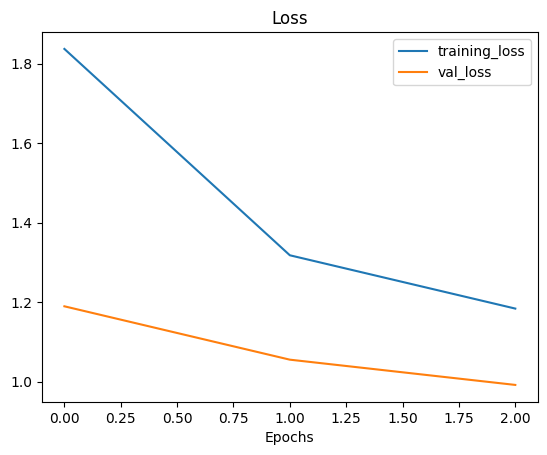

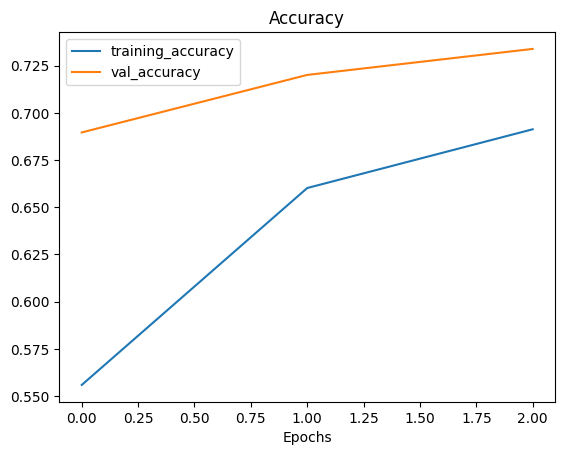

In [57]:
plot_loss_curves(history_101_food_classes_feature_extract)

## Fine-Tuning The Model:

In [58]:
# Unfreeze all of the layers in the base model
model.layers[1].trainable = True

# Refreeze every layer except the last 10
for layer in model.layers[1].layers[:-10]:
    layer.trainable = False

In [59]:
# Recompile model with lower learning rate
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), # Learning rate lowered by 10x
              metrics = ['accuracy'])

In [60]:
# What layers in the model are trainable, and which ones can use mixed precision training?
for layer in model.layers:
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer True float32 <DTypePolicy "mixed_float16">
efficientnetv2-b0 True float32 <DTypePolicy "mixed_float16">
global_average_pooling2d_3 True float32 <DTypePolicy "mixed_float16">
dense_3 True float32 <DTypePolicy "mixed_float16">
softmax_float32 True float32 <DTypePolicy "float32">


In [61]:
# Check which layers are trainable in our base model and their dtype policies
for layer in model.layers[1].layers: # Check the layers of the base model (layer at index 1 of `model`)
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_layer_4 False float32 <DTypePolicy "mixed_float16">
rescaling_4 False float32 <DTypePolicy "mixed_float16">
normalization_4 False float32 <DTypePolicy "mixed_float16">
stem_conv False float32 <DTypePolicy "mixed_float16">
stem_bn False float32 <DTypePolicy "mixed_float16">
stem_activation False float32 <DTypePolicy "mixed_float16">
block1a_project_conv False float32 <DTypePolicy "mixed_float16">
block1a_project_bn False float32 <DTypePolicy "mixed_float16">
block1a_project_activation False float32 <DTypePolicy "mixed_float16">
block2a_expand_conv False float32 <DTypePolicy "mixed_float16">
block2a_expand_bn False float32 <DTypePolicy "mixed_float16">
block2a_expand_activation False float32 <DTypePolicy "mixed_float16">
block2a_project_conv False float32 <DTypePolicy "mixed_float16">
block2a_project_bn False float32 <DTypePolicy "mixed_float16">
block2b_expand_conv False float32 <DTypePolicy "mixed_float16">
block2b_expand_bn False float32 <DTypePolicy "mixed_float16">
block2b_exp

In [62]:
# Look at the last 20 layers
for layer in model.layers[1].layers[-20:]: # Check the layers of the base model (layer at index 1 of `model`)
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

block6g_drop False float32 <DTypePolicy "mixed_float16">
block6g_add False float32 <DTypePolicy "mixed_float16">
block6h_expand_conv False float32 <DTypePolicy "mixed_float16">
block6h_expand_bn False float32 <DTypePolicy "mixed_float16">
block6h_expand_activation False float32 <DTypePolicy "mixed_float16">
block6h_dwconv2 False float32 <DTypePolicy "mixed_float16">
block6h_bn False float32 <DTypePolicy "mixed_float16">
block6h_activation False float32 <DTypePolicy "mixed_float16">
block6h_se_squeeze False float32 <DTypePolicy "mixed_float16">
block6h_se_reshape False float32 <DTypePolicy "mixed_float16">
block6h_se_reduce True float32 <DTypePolicy "mixed_float16">
block6h_se_expand True float32 <DTypePolicy "mixed_float16">
block6h_se_excite True float32 <DTypePolicy "mixed_float16">
block6h_project_conv True float32 <DTypePolicy "mixed_float16">
block6h_project_bn True float32 <DTypePolicy "mixed_float16">
block6h_drop True float32 <DTypePolicy "mixed_float16">
block6h_add True float

In [63]:
# Create another ModelCheckpoint callback to save the next model's progress during training
checkpoint_path_2 = 'model_checkpoints/cp2.weights.h5'
model_checkpoint_2 = tf.keras.callbacks.ModelCheckpoint(checkpoint_path_2,
                                                      monitor = 'val_acc',
                                                      save_best_only = True,
                                                      save_weights_only = True,
                                                      verbose = 0) # Don't print whether or not model is being saved

In [64]:
# Fine-tune for 3 more epochs
fine_tune_epochs = 6

history_101_food_classes_fine_tune_1 = model.fit(train_data,
                                               epochs = fine_tune_epochs,
                                               steps_per_epoch = (len(train_data)),
                                               validation_data = test_data,
                                               validation_steps = int(0.15 * len(test_data)),
                                               callbacks = [create_tensorboard_callback(dir_name = 'training_logs',
                                                                                    experiment_name = 'efficientv2b0_101_classes_all_data_fine_tune_1'),
                                               model_checkpoint_2],
                                               initial_epoch = history_101_food_classes_feature_extract.epoch[-1])

Saving TensorBoard log files to: training_logs/efficientv2b0_101_classes_all_data_fine_tune_1/20250930-113138
Epoch 3/6
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 85002s 36s/step - accuracy: 0.7042 - loss: 1.1655 - val_accuracy: 0.7590 - val_loss: 0.8991
Epoch 4/6


c:\Users\Jake\Documents\Udemy Courses\.venv\Lib\site-packages\keras\src\callbacks\model_checkpoint.py:209: UserWarning: Can save best model only with val_acc available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 30217s 13s/step - accuracy: 0.7463 - loss: 0.9762 - val_accuracy: 0.7738 - val_loss: 0.8430
Epoch 5/6
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 28636s 12s/step - accuracy: 0.7604 - loss: 0.9105 - val_accuracy: 0.7725 - val_loss: 0.8309
Epoch 6/6
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 29872s 13s/step - accuracy: 0.7754 - loss: 0.8520 - val_accuracy: 0.7805 - val_loss: 0.8050


In [65]:
#Save model and its hstory
import numpy as np
model.save('101_classes_all_fine_tune_1.keras')
np.save('history_101_food_classes_fine_tune_1.npy', history_101_food_classes_fine_tune_1)

In [5]:
#Load model and its history
import tensorflow as tf
import numpy as np
model = tf.keras.models.load_model('101_classes_all_fine_tune_1.keras')
history_101_food_classes_fine_tune_1 = np.load('history_101_food_classes_fine_tune_1.npy', allow_pickle = True).item()

c:\Users\Jake\Documents\Udemy Courses\.venv\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [16]:
# Evaluate model on whole test dataset
results_fine_tune_model = model.evaluate(test_data)
results_fine_tune_model

790/790 ━━━━━━━━━━━━━━━━━━━━ 3726s 5s/step - accuracy: 0.7768 - loss: 0.8093


[0.8057827353477478, 0.7755643725395203]

In [17]:
# Save results:
import pickle
with open('results_fine_tune_model.pkl', 'wb') as file:
    pickle.dump(results_fine_tune_model, file)

In [18]:
# Load results:
import pickle
with open('results_fine_tune_model.pkl', 'rb') as file:
    results_fine_tune_model = pickle.load(file)

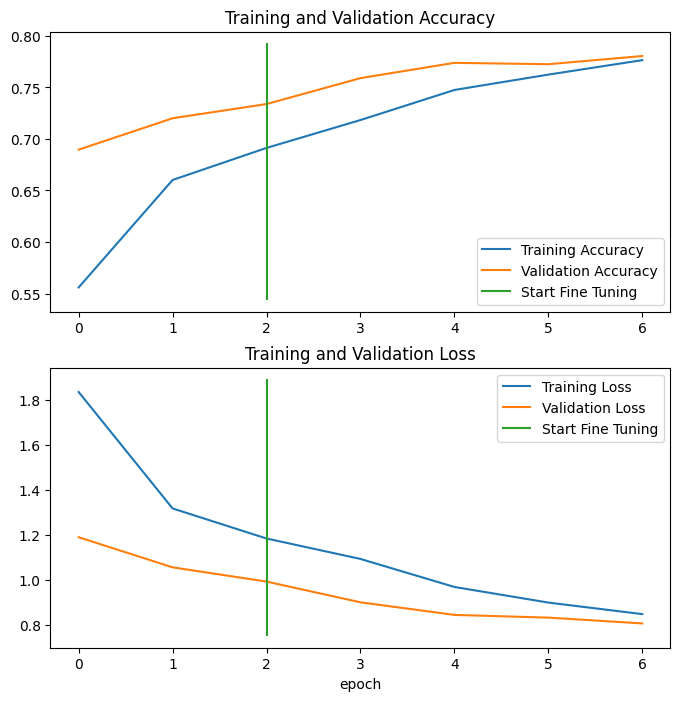

In [ ]:
# Compare the histories of feature extraction model with fine-tuning model
compare_historys(original_history = history_101_food_classes_feature_extract,
                 new_history = history_101_food_classes_fine_tune_1,
                 initial_epochs = 3)

## Making Predictions With The Fine-Tuned Model:

In [30]:
# Make predictions with our model
pred_probs = model.predict(test_data, verbose = 1) # Set verbosity to see how long is left

790/790 ━━━━━━━━━━━━━━━━━━━━ 3482s 4s/step


In [31]:
#Save prediction probabilities
np.save('pred_probs_2.npy', pred_probs)

In [32]:
#Load prediction probabilities
pred_probs = np.load('pred_probs_2.npy')

In [33]:
# Let's see what the first 10 predictions look like
pred_probs[:10]

array([[2.5910675e-04, 2.0837044e-05, 1.2177902e-05, ..., 6.3035195e-04,
        3.7657392e-05, 6.9148038e-03],
       [1.3841356e-05, 4.5637134e-07, 2.0596515e-05, ..., 3.4319537e-06,
        5.2127025e-06, 1.5081202e-06],
       [4.1912399e-06, 7.9446261e-07, 1.6526164e-05, ..., 3.6419562e-05,
        1.9469144e-07, 3.1329685e-06],
       ...,
       [1.4907738e-05, 1.2621690e-08, 4.9497712e-06, ..., 6.2247601e-08,
        2.0079608e-06, 2.6802516e-07],
       [1.3657400e-07, 8.5241254e-06, 1.5721919e-06, ..., 2.7324681e-06,
        8.1760308e-04, 1.1547421e-06],
       [1.0339013e-02, 4.7128207e-05, 1.2271969e-04, ..., 1.4129169e-02,
        6.6461427e-05, 3.6226717e-01]], dtype=float32)

In [34]:
# What does the first prediction probability array look like?
pred_probs[0], len(pred_probs[0]), sum(pred_probs[0])

(array([2.5910675e-04, 2.0837044e-05, 1.2177902e-05, 3.4483789e-06,
        6.2198637e-06, 6.6469242e-06, 9.9393146e-06, 1.2963310e-05,
        1.3543118e-03, 9.4471843e-06, 1.2432078e-04, 3.3292531e-06,
        5.1328633e-04, 1.8975175e-04, 6.0984038e-04, 3.2781270e-05,
        2.6455430e-02, 4.4551564e-04, 1.8166254e-08, 1.7857716e-05,
        1.8491167e-07, 4.2552935e-04, 3.5490231e-03, 9.3021066e-05,
        6.0176335e-05, 2.2398588e-05, 3.4483789e-06, 1.0077640e-04,
        2.3657623e-05, 8.6587685e-01, 7.3376927e-04, 2.0799492e-04,
        1.7444041e-05, 1.7922252e-07, 1.7897969e-03, 5.8658898e-06,
        1.9043756e-06, 1.4773470e-06, 2.1579406e-06, 4.7048805e-05,
        1.2762332e-05, 8.7372182e-06, 1.9924692e-04, 1.1571476e-07,
        5.9923849e-07, 2.8493620e-02, 3.6062801e-07, 1.1662232e-07,
        2.0192940e-06, 6.6990565e-06, 3.4215434e-06, 3.1032050e-06,
        4.8820275e-06, 2.2662616e-05, 1.4096943e-06, 1.0769579e-04,
        5.4250613e-06, 1.9346544e-05, 4.1946668e

In [35]:
print(f'Number of prediction probabilities for sample 0: {len(pred_probs[0])}')
print(f'What prediction probability sample 0 looke like:\n {pred_probs[0]}')
print(f'The class with the highest predicted probability by the model for sample 0: {pred_probs[0].argmax()}')

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looke like:
 [2.5910675e-04 2.0837044e-05 1.2177902e-05 3.4483789e-06 6.2198637e-06
 6.6469242e-06 9.9393146e-06 1.2963310e-05 1.3543118e-03 9.4471843e-06
 1.2432078e-04 3.3292531e-06 5.1328633e-04 1.8975175e-04 6.0984038e-04
 3.2781270e-05 2.6455430e-02 4.4551564e-04 1.8166254e-08 1.7857716e-05
 1.8491167e-07 4.2552935e-04 3.5490231e-03 9.3021066e-05 6.0176335e-05
 2.2398588e-05 3.4483789e-06 1.0077640e-04 2.3657623e-05 8.6587685e-01
 7.3376927e-04 2.0799492e-04 1.7444041e-05 1.7922252e-07 1.7897969e-03
 5.8658898e-06 1.9043756e-06 1.4773470e-06 2.1579406e-06 4.7048805e-05
 1.2762332e-05 8.7372182e-06 1.9924692e-04 1.1571476e-07 5.9923849e-07
 2.8493620e-02 3.6062801e-07 1.1662232e-07 2.0192940e-06 6.6990565e-06
 3.4215434e-06 3.1032050e-06 4.8820275e-06 2.2662616e-05 1.4096943e-06
 1.0769579e-04 5.4250613e-06 1.9346544e-05 4.1946668e-02 6.9638382e-08
 6.2554818e-07 3.5026828e-06 4.2838423e-05 1.

In [36]:
# Get the pred classes of each label
pred_classes = pred_probs.argmax(axis = 1)

# How do they look?
pred_classes[:10]

array([29, 81, 91, 53, 97, 97, 10, 31,  3, 94])

In [ ]:
# To get our test labels, we need to unravel our test_data BatchDataset
y_labels = []
for _, labels in test_data.unbatch():
    y_labels.append(labels.numpy())
y_labels[:10] # Look at the first 10

[np.int64(29),
 np.int64(81),
 np.int64(91),
 np.int64(53),
 np.int64(97),
 np.int64(97),
 np.int64(10),
 np.int64(31),
 np.int64(3),
 np.int64(100)]

## Evaluating The Model's Predictions:

In [38]:
# Let's try scikit-learn's accuracy score function and see what it comes up with
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true = y_labels,
                                  y_pred = pred_classes)
sklearn_accuracy

0.7755643564356436

In [39]:
# Does this metric come close to our model's evaluate result?
import numpy as np
np.isclose(results_fine_tune_model[1], sklearn_accuracy)

np.True_

## Creating A Confusion Matrix:

In [42]:
# Get a list of class names
class_names = ds_info.features['label'].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [43]:
# Note: The following confusion matrix code is a remix of Scikit-Learn's 
# plot_confusion_matrix function - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Changed (plot x-labels vertically) ###
  plt.xticks(rotation = 90, fontsize = text_size)
  plt.yticks(fontsize = text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [44]:
make_confusion_matrix(y_true = y_labels,
                      y_pred = pred_classes,
                      classes = class_names,
                      figsize = (100, 100),
                      text_size = 20,
                      savefig = True)

## Getting A Classification Report:

In [45]:
from sklearn.metrics import classification_report
print(classification_report(y_true = y_labels,
                            y_pred = pred_classes))

              precision    recall  f1-score   support

           0       0.62      0.56      0.58       250
           1       0.75      0.82      0.79       250
           2       0.79      0.80      0.80       250
           3       0.84      0.78      0.81       250
           4       0.72      0.69      0.70       250
           5       0.62      0.65      0.64       250
           6       0.83      0.88      0.86       250
           7       0.81      0.93      0.87       250
           8       0.57      0.59      0.58       250
           9       0.71      0.65      0.68       250
          10       0.65      0.68      0.66       250
          11       0.73      0.84      0.78       250
          12       0.84      0.83      0.83       250
          13       0.73      0.76      0.74       250
          14       0.76      0.75      0.75       250
          15       0.74      0.51      0.61       250
          16       0.71      0.61      0.66       250
          17       0.76    

In [46]:
# Get a dictionary of the classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict = True)
classification_report_dict

{'0': {'precision': 0.6150442477876106,
  'recall': 0.556,
  'f1-score': 0.5840336134453782,
  'support': 250.0},
 '1': {'precision': 0.7518248175182481,
  'recall': 0.824,
  'f1-score': 0.7862595419847328,
  'support': 250.0},
 '2': {'precision': 0.7913385826771654,
  'recall': 0.804,
  'f1-score': 0.7976190476190477,
  'support': 250.0},
 '3': {'precision': 0.8441558441558441,
  'recall': 0.78,
  'f1-score': 0.8108108108108109,
  'support': 250.0},
 '4': {'precision': 0.7178423236514523,
  'recall': 0.692,
  'f1-score': 0.7046843177189409,
  'support': 250.0},
 '5': {'precision': 0.6245210727969349,
  'recall': 0.652,
  'f1-score': 0.6379647749510763,
  'support': 250.0},
 '6': {'precision': 0.8339622641509434,
  'recall': 0.884,
  'f1-score': 0.858252427184466,
  'support': 250.0},
 '7': {'precision': 0.8146853146853147,
  'recall': 0.932,
  'f1-score': 0.8694029850746269,
  'support': 250.0},
 '8': {'precision': 0.5670498084291188,
  'recall': 0.592,
  'f1-score': 0.579256360078277

Plot Every Class's F1-Score:

In [47]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
    if k == 'accuracy': # Stop once we get to accuracy key
        break
    else:
        # Add class names and f1-scores to new dictionary
        class_f1_scores[class_names[int(k)]] = v['f1-score']
class_f1_scores

{'apple_pie': 0.5840336134453782,
 'baby_back_ribs': 0.7862595419847328,
 'baklava': 0.7976190476190477,
 'beef_carpaccio': 0.8108108108108109,
 'beef_tartare': 0.7046843177189409,
 'beet_salad': 0.6379647749510763,
 'beignets': 0.858252427184466,
 'bibimbap': 0.8694029850746269,
 'bread_pudding': 0.5792563600782779,
 'breakfast_burrito': 0.6805845511482255,
 'bruschetta': 0.6640625,
 'caesar_salad': 0.7798507462686567,
 'cannoli': 0.8329979879275654,
 'caprese_salad': 0.7411764705882353,
 'carrot_cake': 0.7535070140280561,
 'ceviche': 0.6066350710900474,
 'cheesecake': 0.6565874730021598,
 'cheese_plate': 0.7788649706457925,
 'chicken_curry': 0.7027027027027027,
 'chicken_quesadilla': 0.7810650887573964,
 'chicken_wings': 0.8441814595660749,
 'chocolate_cake': 0.7021696252465484,
 'chocolate_mousse': 0.5813008130081301,
 'churros': 0.8732394366197183,
 'clam_chowder': 0.837573385518591,
 'club_sandwich': 0.8475247524752475,
 'crab_cakes': 0.6719367588932806,
 'creme_brulee': 0.8705882

In [48]:
# Turn f1-scores into dataframe for visualization
import pandas as pd
f1_scores = pd.DataFrame({'class_names': list(class_f1_scores.keys()),
                          'f1-score': list(class_f1_scores.values())}).sort_values('f1-score', ascending = False)
f1_scores

,class_names,f1-score
33,edamame,0.984064
63,macarons,0.955466
64,miso_soup,0.919679
88,seaweed_salad,0.917323
75,pho,0.908046
...,...,...
8,bread_pudding,0.579256
82,ravioli,0.572072
93,steak,0.518359
39,foie_gras,0.512586


In [49]:
# What classes had the top 10 best F1-scores?
f1_scores[:10]

,class_names,f1-score
33,edamame,0.984064
63,macarons,0.955466
64,miso_soup,0.919679
88,seaweed_salad,0.917323
75,pho,0.908046
91,spaghetti_carbonara,0.903846
69,oysters,0.902724
68,onion_rings,0.900196
30,deviled_eggs,0.899194
32,dumplings,0.897796


In [50]:
# What classes had the bottom 10 worst F1-scores?
f1_scores[-10:]

,class_names,f1-score
15,ceviche,0.606635
56,huevos_rancheros,0.600423
0,apple_pie,0.584034
22,chocolate_mousse,0.581301
37,filet_mignon,0.580524
8,bread_pudding,0.579256
82,ravioli,0.572072
93,steak,0.518359
39,foie_gras,0.512586
77,pork_chop,0.477752


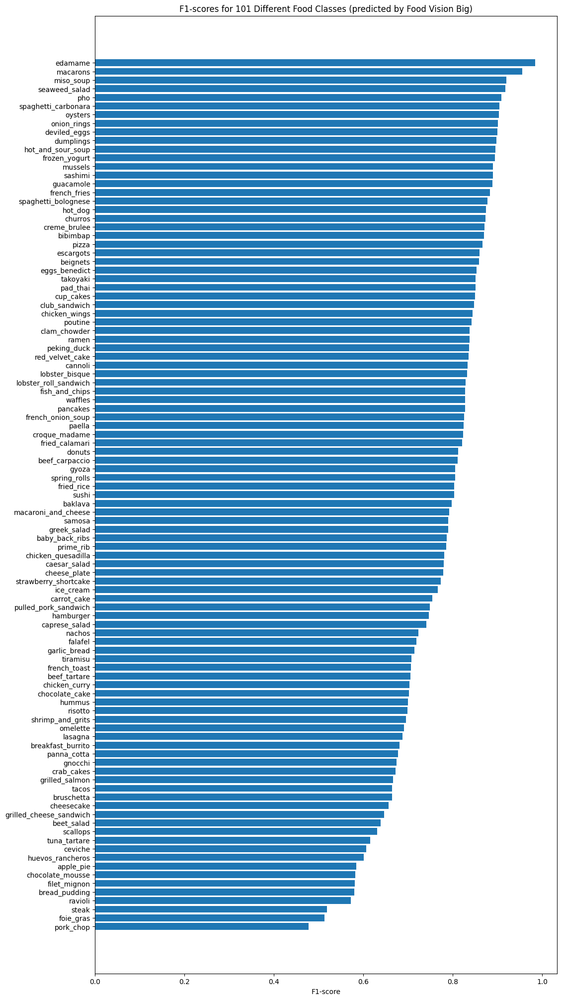

In [51]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize = (12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores['f1-score'].values) # Get f1-score values
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores['class_names'])
ax.set_xlabel('F1-score')
ax.set_title('F1-scores for 101 Different Food Classes (predicted by Food Vision Big)')
ax.invert_yaxis(); # Reverse the order of our plot

## Visualizing Predictions On Test Images:

In [53]:
# Not necessary for loading from the test dataset anymore, but still prepare this function for working with custom images later
# Create a function to load and prepare images
def load_and_prep_image(filename, img_shape = 224, scale = True):
    """
    Reads in an image from filename, turns it into a tensor, and reshapes it into a specified shape (img_shape, img_shape, color_channels = 3).

    Args:
        filename (str): Path to target image
        image_shape (int): Height.width dimension of target image size
        scale (bool): Whether to scale pizel values from 0-255 to 0-1 or not
    
    Returns:
        Image tensor of shape (img_shape, img_shape, 3)
    """
    # Read in the image
    img = tf.io.read_file(filename)

    # Decode image into tensor
    img = tf.io.decode_image(img, channels = 3)

    # Resize the image
    img = tf.image.resize(img, [img_shape, img_shape])

    # Scale? Yes/no
    if scale:
        # Rescale the image (get all values between 0 and 1)
        return img/255.
    else:
        return img # Don't need to rescale images for EfficientNet models in TensorFlow

In [ ]:
import matplotlib.pyplot as plt
import random

def plot_random_predictions(dataset, model, class_names, num_images = 3):
    """
    Randomly selects images from a tf.data.Dataset, makes predictions,
    and plots them with ground truth vs predicted labels.
    """
    # Unbatch so we can access individual (image, label) pairs
    all_samples = list(dataset.unbatch())
    chosen_samples = random.sample(all_samples, num_images)

    plt.figure(figsize=(5 * num_images, 5))
    for i, (img, label) in enumerate(chosen_samples):
        # Expand dims for model prediction
        img_expanded = tf.expand_dims(img, axis=0)
        pred_prob = model.predict(img_expanded, verbose=0)
        pred_class = class_names[pred_prob.argmax()]
        true_class = class_names[label.numpy()]

        # Plot
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img.numpy().astype("uint8"))
        title_color = "g" if pred_class == true_class else "r"
        plt.title(f"Actual: {true_class}\nPred: {pred_class}\nProb: {pred_prob.max():.2f}",
                  color=title_color)
        plt.axis(False)
    plt.show()

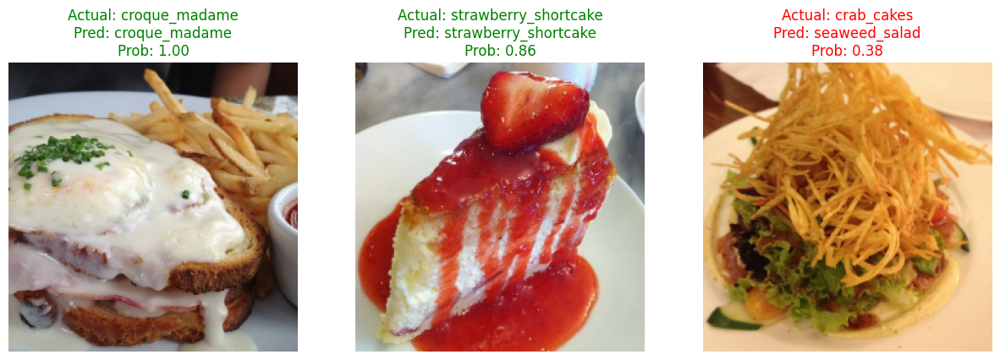

In [59]:
# Make preds on a series of random images
plot_random_predictions(test_data, model, class_names, num_images = 3)

## Finding The Most Wrong Predictions:

In [77]:
import pandas as pd

# Build DataFrame with predictions vs ground truth
pred_df = pd.DataFrame({
    "index": range(len(y_labels)),   # <-- keep original order
    "y_true": y_labels,
    "y_pred": pred_classes,
    "pred_conf": pred_probs.max(axis=1),  # highest probability per sample
    "y_true_classname": [class_names[i] for i in y_labels],
    "y_pred_classname": [class_names[i] for i in pred_classes]
})
pred_df.head(10)

,index,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,0,29,29,0.865877,cup_cakes,cup_cakes
1,1,81,81,0.986076,ramen,ramen
2,2,91,91,0.966686,spaghetti_carbonara,spaghetti_carbonara
3,3,53,53,0.821784,hamburger,hamburger
4,4,97,97,0.998491,takoyaki,takoyaki
5,5,97,97,0.917034,takoyaki,takoyaki
6,6,10,10,0.655806,bruschetta,bruschetta
7,7,31,31,0.999651,donuts,donuts
8,8,3,3,0.994398,beef_carpaccio,beef_carpaccio
9,9,100,94,0.415341,waffles,strawberry_shortcake


In [78]:
# Add correctness flag
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head(10)

,index,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,0,29,29,0.865877,cup_cakes,cup_cakes,True
1,1,81,81,0.986076,ramen,ramen,True
2,2,91,91,0.966686,spaghetti_carbonara,spaghetti_carbonara,True
3,3,53,53,0.821784,hamburger,hamburger,True
4,4,97,97,0.998491,takoyaki,takoyaki,True
5,5,97,97,0.917034,takoyaki,takoyaki,True
6,6,10,10,0.655806,bruschetta,bruschetta,True
7,7,31,31,0.999651,donuts,donuts,True
8,8,3,3,0.994398,beef_carpaccio,beef_carpaccio,True
9,9,100,94,0.415341,waffles,strawberry_shortcake,False


In [79]:
# Sort wrong predictions by confidence (highest confidence but wrong)
top_wrong = pred_df[pred_df["pred_correct"] == False] \
                .sort_values("pred_conf", ascending=False) \
                .reset_index(drop=True)

top_wrong.head(20)

,index,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,1113,72,67,0.996638,pancakes,omelette,False
1,1218,71,65,0.996591,paella,mussels,False
2,16129,65,69,0.996495,mussels,oysters,False
3,9735,87,30,0.995772,scallops,deviled_eggs,False
4,7455,43,68,0.989459,fried_calamari,onion_rings,False
5,11626,31,6,0.989392,donuts,beignets,False
6,22547,42,67,0.989143,french_toast,omelette,False
7,810,5,11,0.988285,beet_salad,caesar_salad,False
8,13884,46,10,0.987634,garlic_bread,bruschetta,False
9,217,44,71,0.987283,fried_rice,paella,False


In [80]:
import matplotlib.pyplot as plt

def plot_most_wrong(top_wrong, test_images, class_names, num_images=9, start_index=0):
    """
    Plots a grid of the most wrong predictions from the model.

    Args:
        top_wrong (pd.DataFrame): DataFrame of wrong predictions sorted by confidence.
        test_images (list): List of (image, label) pairs from test_data.unbatch().
        class_names (list): List of class names.
        num_images (int): Number of images to display.
        start_index (int): Starting index in the sorted DataFrame (lets you "page" through).
    """
    plt.figure(figsize=(15, 10))
    subset = top_wrong.iloc[start_index:start_index + num_images]

    for i, row in enumerate(subset.itertuples()):
        # Use the saved dataset index to get the right image
        img, _ = test_images[row.index]

        plt.subplot(3, 3, i + 1)
        plt.imshow(img.numpy().astype("uint8"))
        plt.title(f"Actual: {row.y_true_classname}\nPred: {row.y_pred_classname}\nProb: {row.pred_conf:.2f}",
                  color="r")
        plt.axis(False)

    plt.tight_layout()
    plt.show()

In [69]:
# Unbatch test_data into a list of (image, label) pairs
test_images = list(test_data.unbatch().map(lambda x, y: (x, y)))

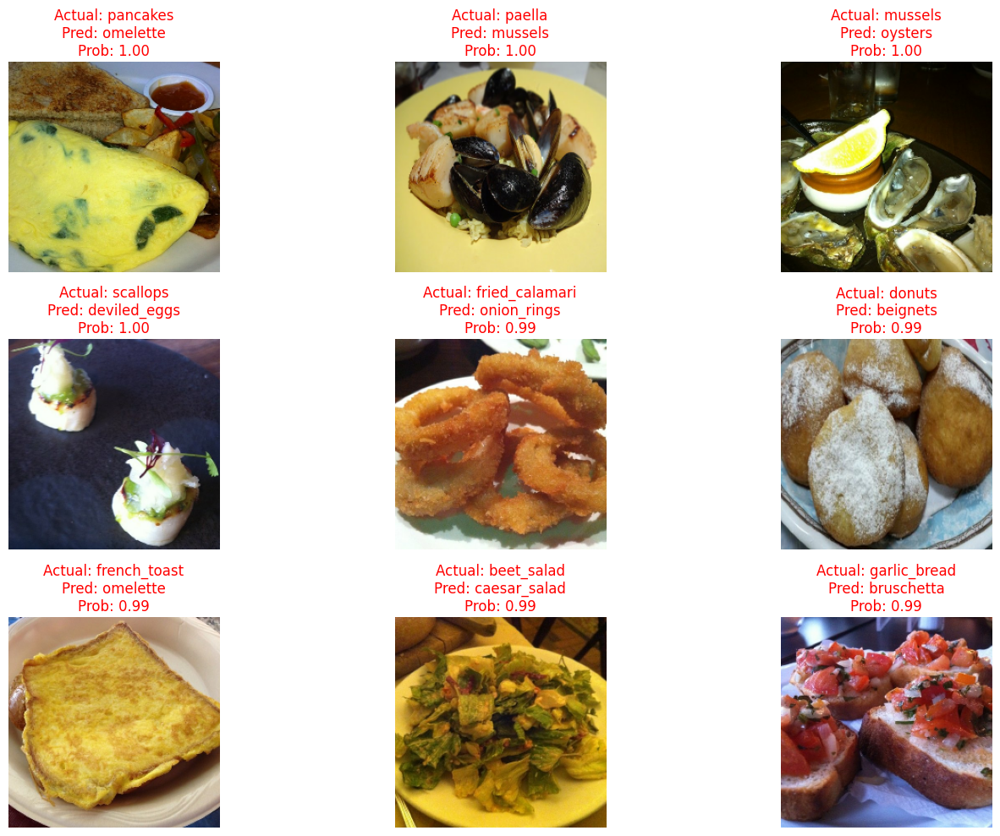

In [81]:
# View the top 9 most wrong predictions (highest confidence mistakes)
plot_most_wrong(top_wrong, test_images, class_names, num_images=9, start_index=0)

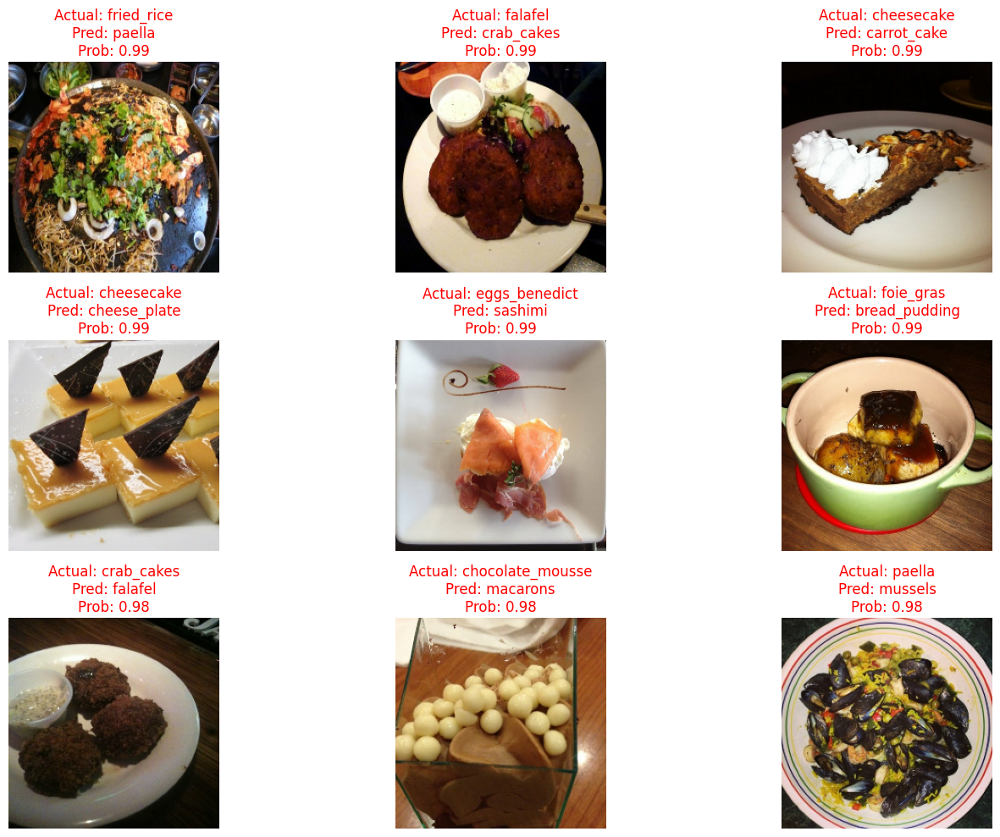

In [82]:
# View the next 9 wrong predictions (indices 9–17)
plot_most_wrong(top_wrong, test_images, class_names, num_images=9, start_index=9)

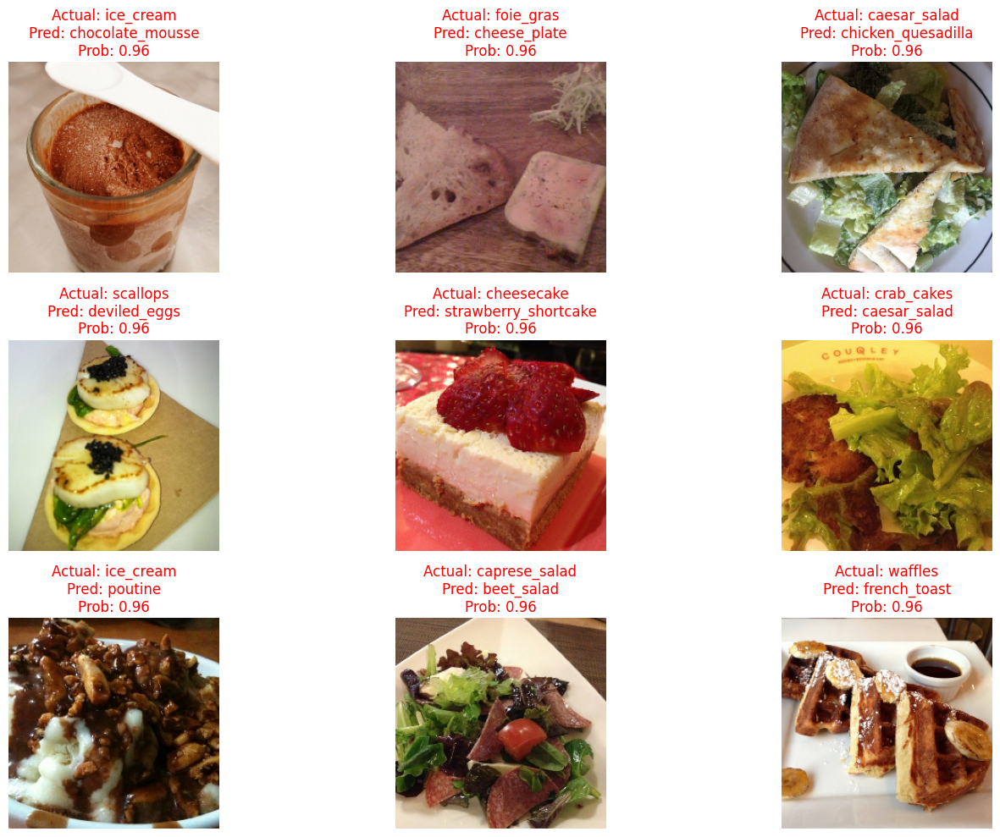

In [83]:
# Jump further down the list (e.g. mistakes ranked 50–59)
plot_most_wrong(top_wrong, test_images, class_names, num_images=9, start_index=50)

## Testing The Model On Custom Images:

In [84]:
# Get custom images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

from helper_functions import unzip_data
unzip_data('custom_food_images.zip')

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [85]:
import os

# Get the custom food images' filepaths
custom_food_images = ['custom_food_images/' + img_path for img_path in os.listdir('custom_food_images')]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


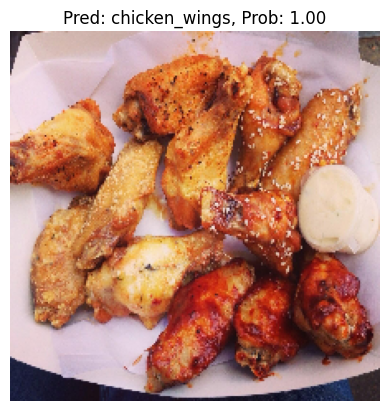

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


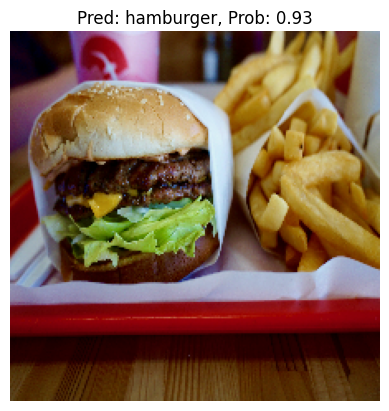

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


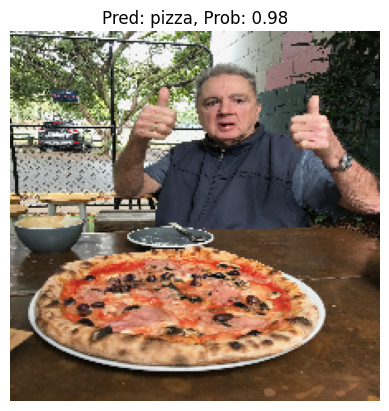

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


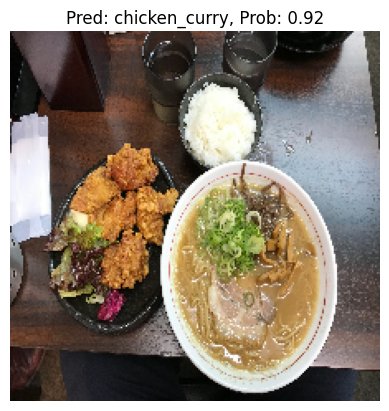

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


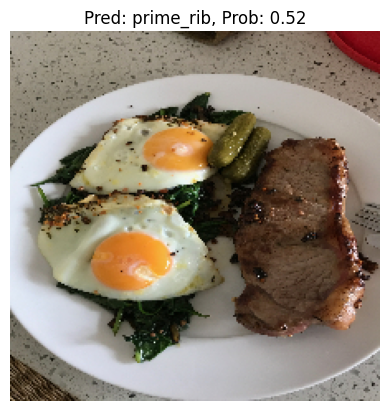

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


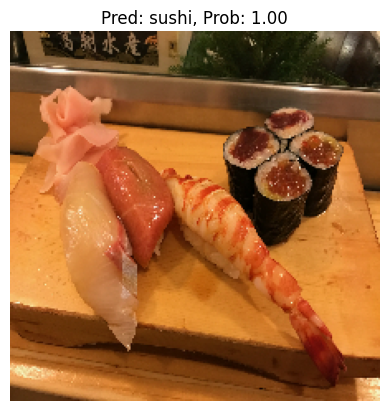

In [86]:
for img_path in custom_food_images:
    # Load and preprocess image
    img = load_and_prep_image(img_path, img_shape=224, scale=False)  
    img_expanded = tf.expand_dims(img, axis=0)  # model expects [batch, h, w, c]

    # Make prediction
    pred_prob = model.predict(img_expanded)
    pred_class = class_names[pred_prob.argmax()]

    # Plot
    plt.figure()
    plt.imshow(img/255.)  # divide by 255 for display only
    plt.title(f"Pred: {pred_class}, Prob: {pred_prob.max():.2f}")
    plt.axis(False)
    plt.show()